<a href="https://colab.research.google.com/github/DS-1090/UAV_Detection/blob/main/UAV_gpu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install opendatasets


In [2]:
import opendatasets as od
import pandas

od.download("https://www.kaggle.com/datasets/div456/uav-yolov8")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: div456
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/div456/uav-yolov8


100%|██████████| 79.5M/79.5M [00:01<00:00, 74.7MB/s]


In [4]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 757.0/757.0 kB 4.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [5]:
import ultralytics
import torch

ultralytics.checks()

Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.9/78.2 GB disk)


In [6]:
from ultralytics import YOLO
model = YOLO('yolov8n.pt')


100%|██████████| 6.23M/6.23M [00:00<00:00, 74.2MB/s]


In [9]:
results = model.train(data='/content/uav-yolov8/UAV_YOLOv8/data.yaml', epochs=6,imgsz=640,batch=-1,save=True,project='/content/output')


Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/uav-yolov8/UAV_YOLOv8/data.yaml, epochs=6, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/output, name=train22, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=T

train: Scanning /content/uav-yolov8/UAV_YOLOv8/train/labels.cache... 1931 images, 3 backgrounds, 0 corrupt: 100%|██████████| 1931/1931 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/uav-yolov8/UAV_YOLOv8/valid/labels.cache... 184 images, 0 backgrounds, 0 corrupt: 100%|██████████| 184/184 [00:00<?, ?it/s]


Plotting labels to /content/output/train22/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005859375), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/output/train22
Starting training for 6 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/6      10.7G       1.18      1.268      1.487        149        640: 100%|██████████| 26/26 [00:44<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.50s/it]

                   all        184        223      0.854      0.803      0.859      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/6       9.8G      1.199      1.218      1.504        151        640: 100%|██████████| 26/26 [00:40<00:00,  1.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:04<00:00,  2.12s/it]


                   all        184        223      0.764      0.756      0.799      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/6      9.74G      1.241      1.182       1.52        151        640: 100%|██████████| 26/26 [00:39<00:00,  1.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.78s/it]

                   all        184        223      0.585      0.512      0.531      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/6      9.72G      1.219      1.119      1.529        144        640: 100%|██████████| 26/26 [00:47<00:00,  1.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.01it/s]

                   all        184        223      0.624      0.592      0.636      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/6      9.73G      1.202      1.011      1.495        132        640: 100%|██████████| 26/26 [00:44<00:00,  1.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.49s/it]

                   all        184        223      0.855       0.78      0.842      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        6/6      9.66G      1.115     0.8922      1.434        136        640: 100%|██████████| 26/26 [00:42<00:00,  1.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:03<00:00,  1.74s/it]

                   all        184        223      0.978      0.888      0.961      0.536



6 epochs completed in 0.084 hours.
Optimizer stripped from /content/output/train22/weights/last.pt, 6.2MB
Optimizer stripped from /content/output/train22/weights/best.pt, 6.2MB

Validating /content/output/train22/weights/best.pt...
Ultralytics YOLOv8.2.17 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


                   all        184        223      0.978      0.888      0.961      0.536
Speed: 0.3ms preprocess, 2.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to /content/output/train22



0: 640x640 1 drones, 19.8ms
Speed: 2.1ms preprocess, 19.8ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


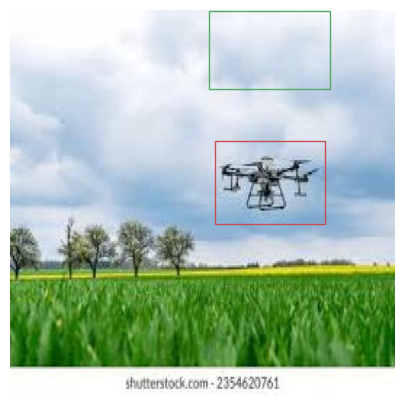


0: 640x640 1 drones, 16.2ms
Speed: 2.2ms preprocess, 16.2ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


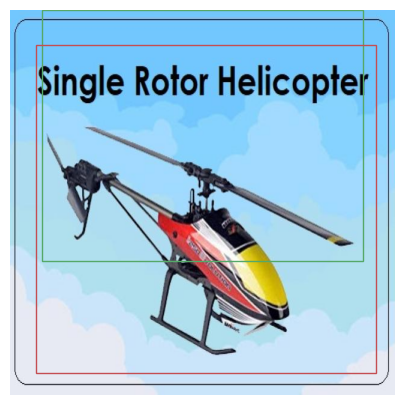


0: 640x640 1 drones, 12.1ms
Speed: 2.0ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


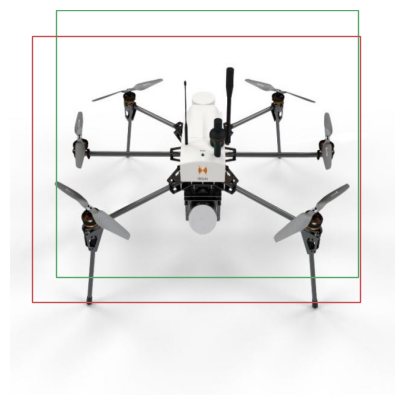


0: 640x640 1 drones, 10.8ms
Speed: 1.9ms preprocess, 10.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


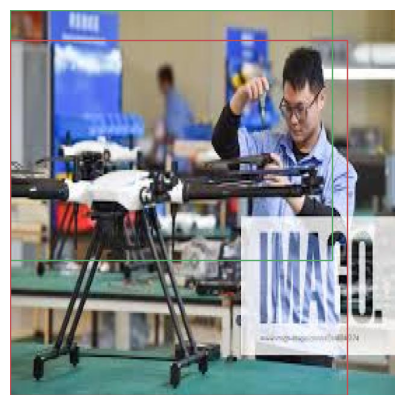


0: 640x640 1 drones, 15.7ms
Speed: 2.0ms preprocess, 15.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


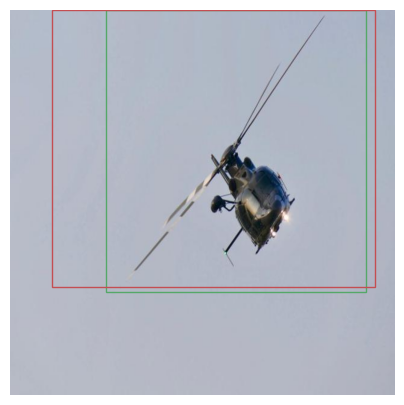


0: 640x640 1 drones, 12.8ms
Speed: 1.9ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


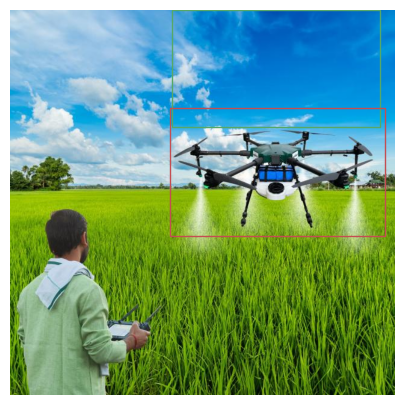


0: 640x640 1 drones, 13.4ms
Speed: 2.0ms preprocess, 13.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


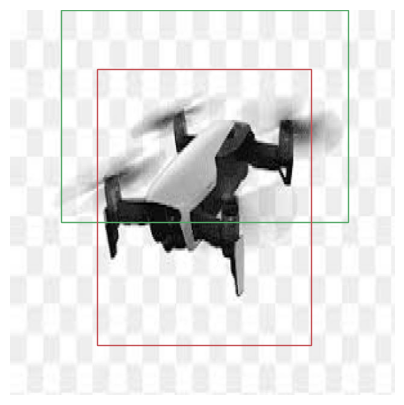


0: 640x640 1 drones, 12.8ms
Speed: 2.1ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


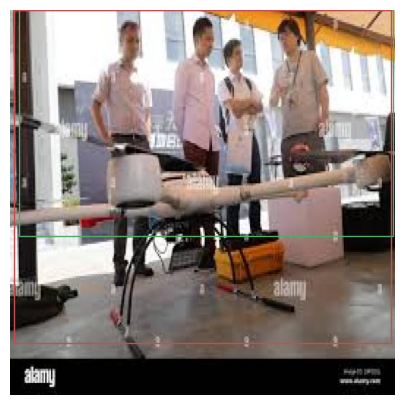


0: 640x640 (no detections), 17.1ms
Speed: 1.9ms preprocess, 17.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


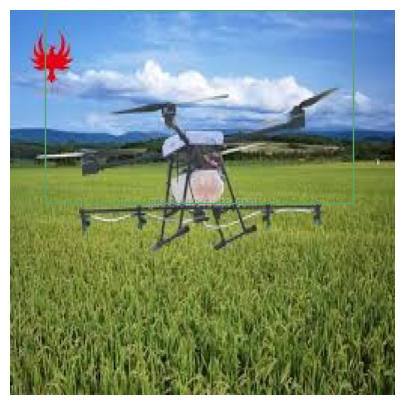


0: 640x640 1 drones, 15.6ms
Speed: 2.1ms preprocess, 15.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


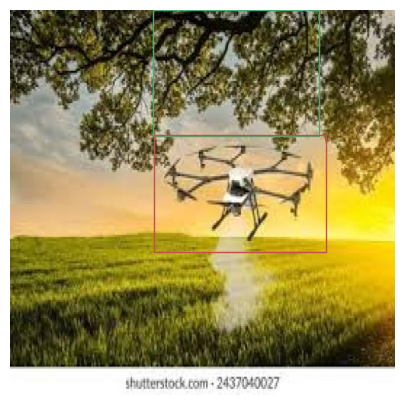


0: 640x640 1 drones, 13.6ms
Speed: 1.9ms preprocess, 13.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


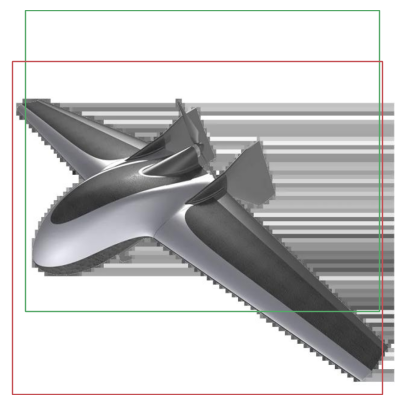


0: 640x640 1 drones, 13.5ms
Speed: 2.0ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


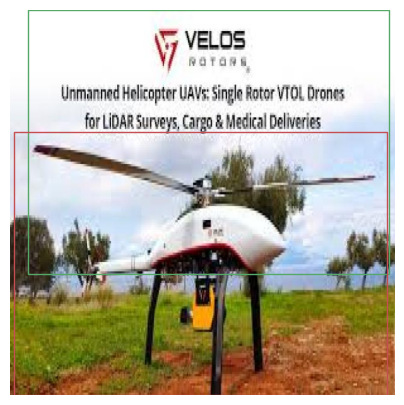


0: 640x640 1 drones, 13.9ms
Speed: 1.9ms preprocess, 13.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


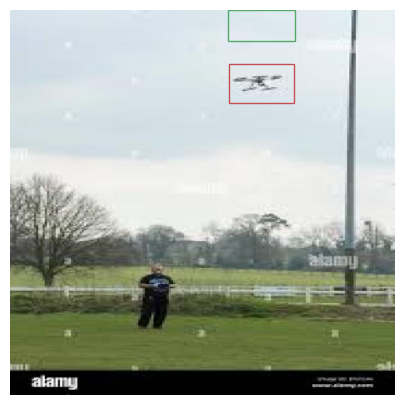


0: 640x640 1 drones, 13.2ms
Speed: 1.8ms preprocess, 13.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


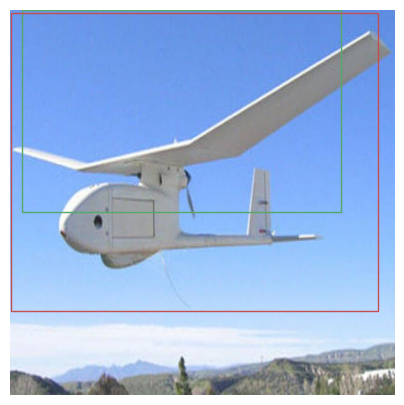


0: 640x640 1 drones, 13.4ms
Speed: 1.8ms preprocess, 13.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


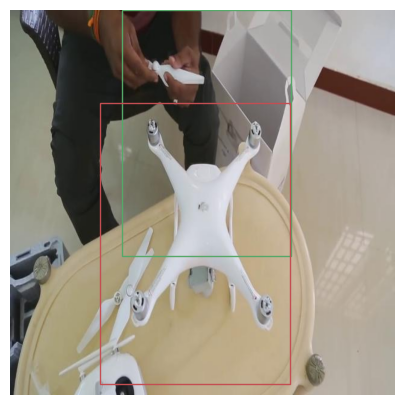


0: 640x640 1 drones, 15.2ms
Speed: 1.9ms preprocess, 15.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


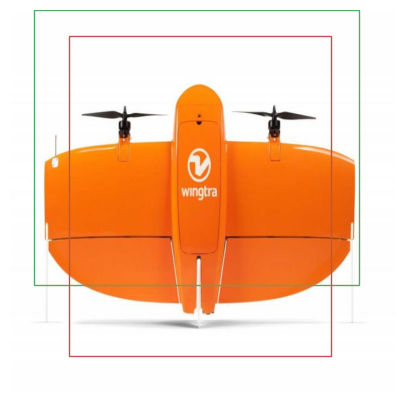


0: 640x640 (no detections), 15.1ms
Speed: 2.0ms preprocess, 15.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


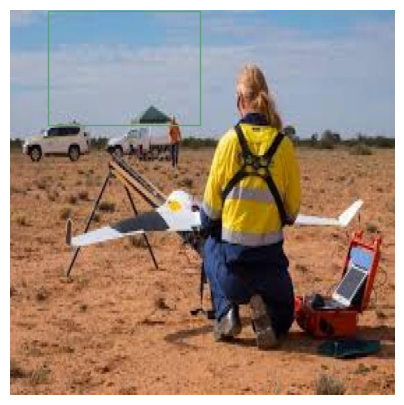


0: 640x640 1 drones, 18.2ms
Speed: 1.9ms preprocess, 18.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


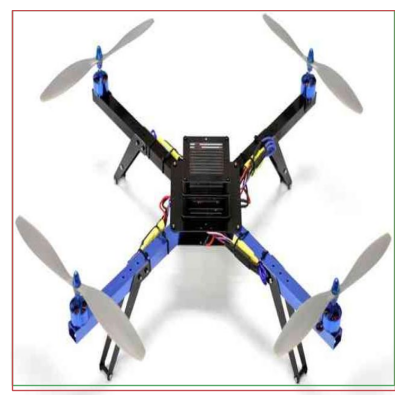


0: 640x640 1 drones, 12.7ms
Speed: 1.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


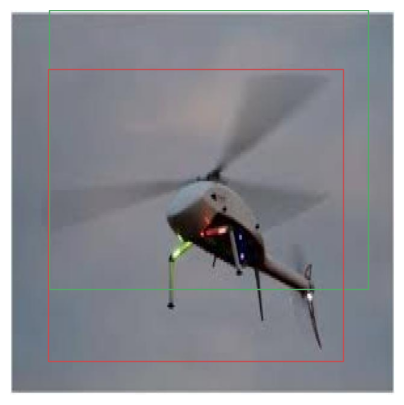


0: 640x640 1 drones, 14.1ms
Speed: 2.0ms preprocess, 14.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


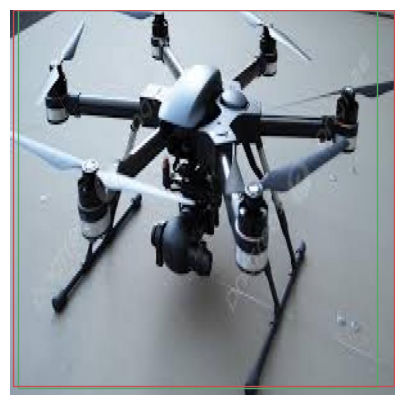


0: 640x640 1 drones, 14.6ms
Speed: 2.0ms preprocess, 14.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


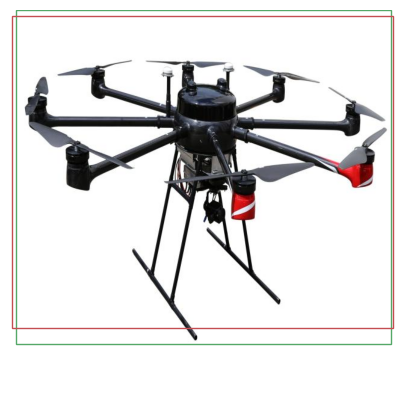


0: 640x640 1 drones, 17.3ms
Speed: 1.9ms preprocess, 17.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


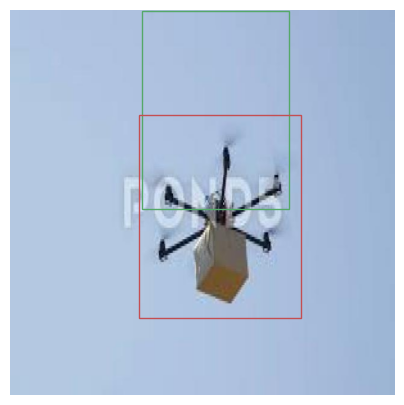


0: 640x640 1 drones, 18.0ms
Speed: 2.0ms preprocess, 18.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


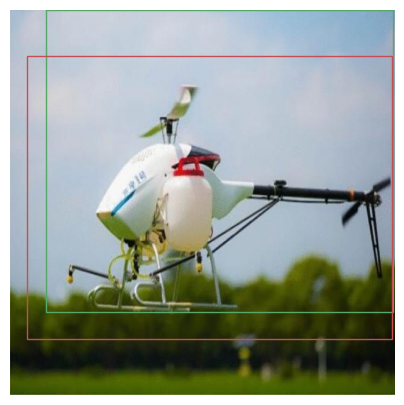


0: 640x640 1 drones, 13.3ms
Speed: 1.8ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


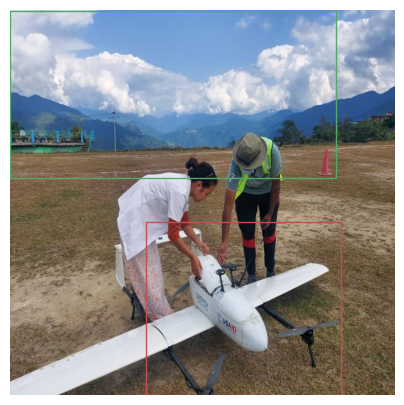


0: 640x640 1 drones, 14.0ms
Speed: 5.2ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


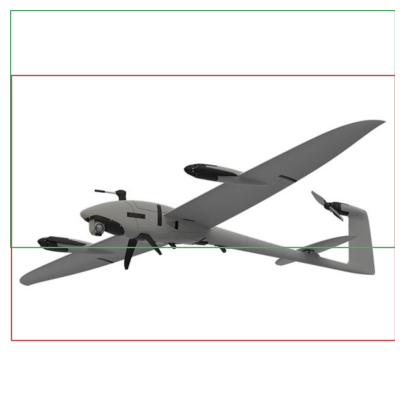


0: 640x640 1 drones, 17.9ms
Speed: 2.1ms preprocess, 17.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


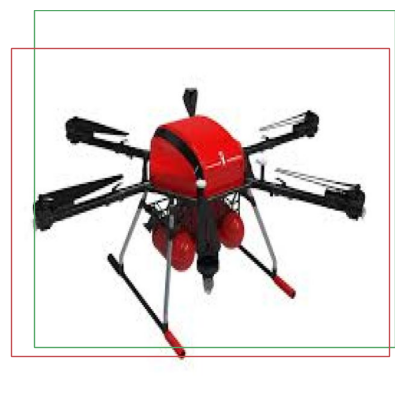


0: 640x640 1 drones, 14.8ms
Speed: 1.9ms preprocess, 14.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


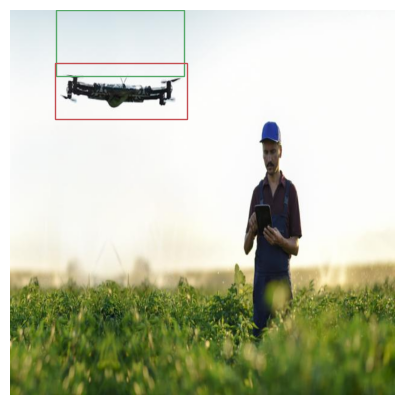


0: 640x640 1 drones, 13.0ms
Speed: 1.9ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


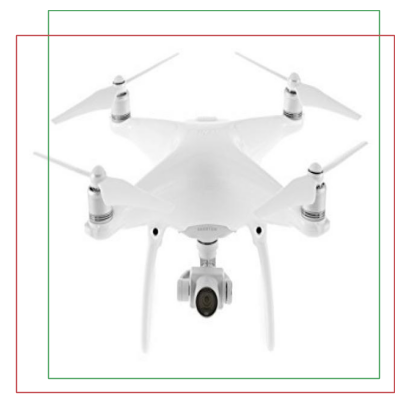


0: 640x640 1 drones, 13.1ms
Speed: 1.9ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


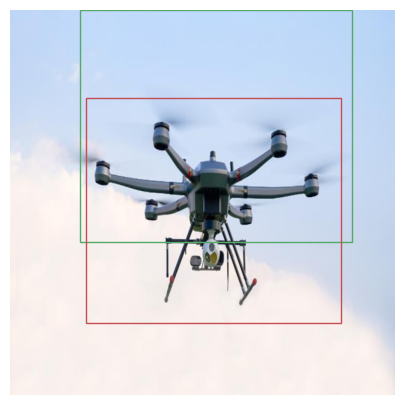


0: 640x640 1 drones, 13.9ms
Speed: 1.8ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


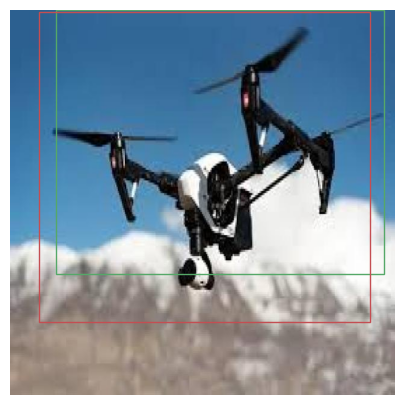


0: 640x640 1 drones, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


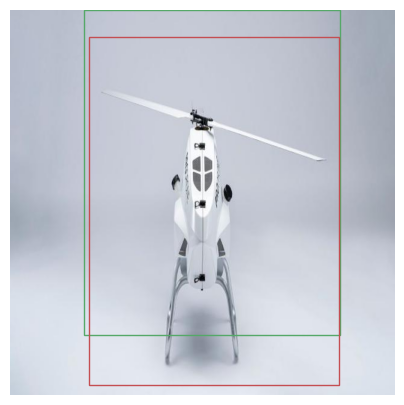


0: 640x640 2 droness, 16.6ms
Speed: 1.8ms preprocess, 16.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


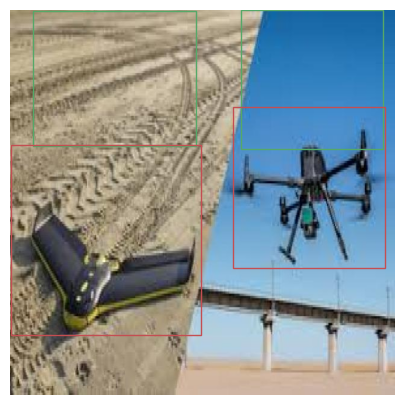


0: 640x640 1 drones, 14.9ms
Speed: 1.9ms preprocess, 14.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


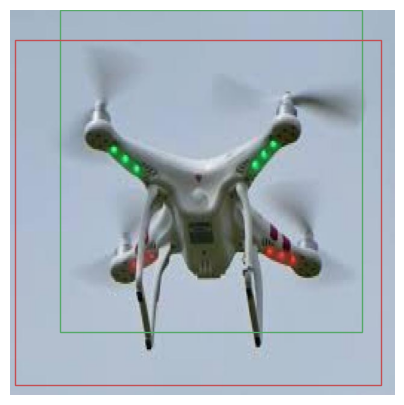


0: 640x640 1 drones, 15.1ms
Speed: 2.0ms preprocess, 15.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


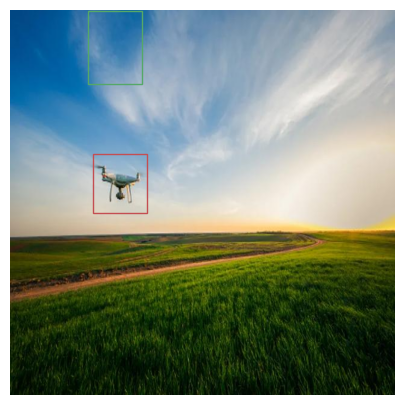


0: 640x640 1 drones, 16.0ms
Speed: 1.9ms preprocess, 16.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


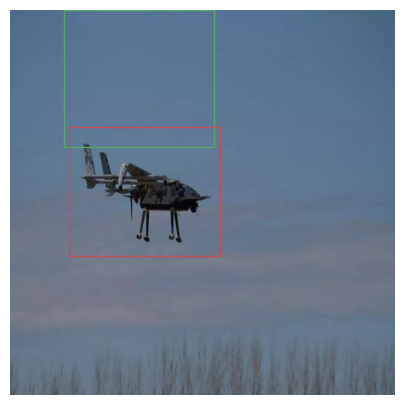


0: 640x640 (no detections), 16.4ms
Speed: 1.9ms preprocess, 16.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


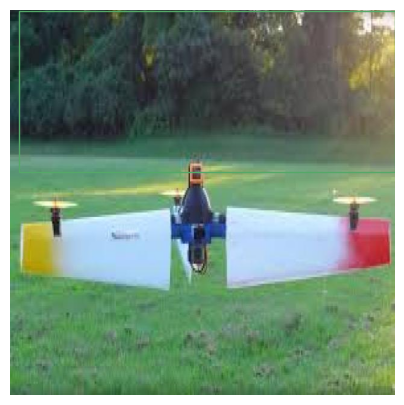


0: 640x640 2 droness, 12.8ms
Speed: 1.9ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


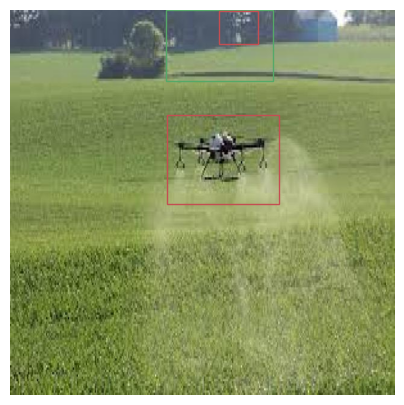


0: 640x640 1 drones, 13.9ms
Speed: 1.8ms preprocess, 13.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


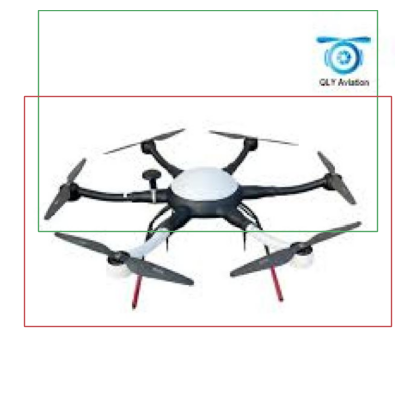


0: 640x640 1 drones, 16.8ms
Speed: 3.1ms preprocess, 16.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


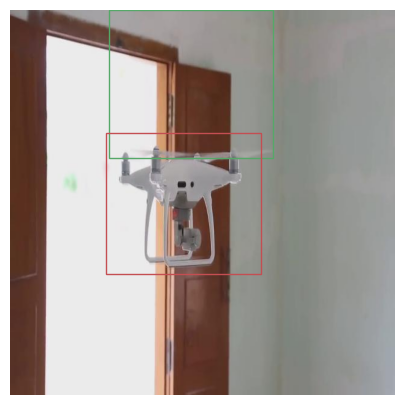


0: 640x640 1 drones, 26.6ms
Speed: 4.0ms preprocess, 26.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


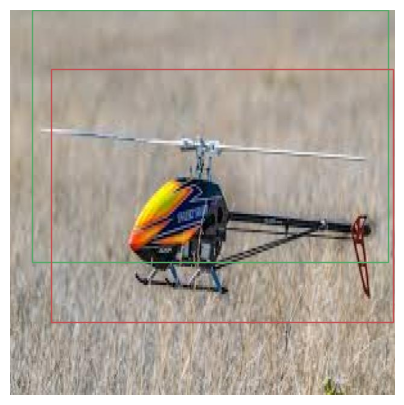


0: 640x640 1 drones, 21.9ms
Speed: 1.8ms preprocess, 21.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


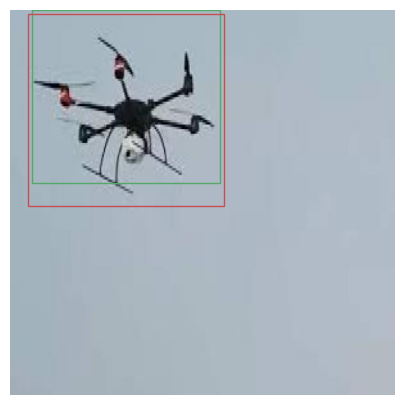


0: 640x640 1 drones, 16.2ms
Speed: 1.8ms preprocess, 16.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


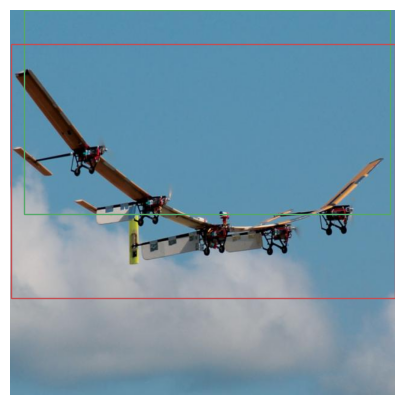


0: 640x640 2 droness, 16.3ms
Speed: 6.0ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


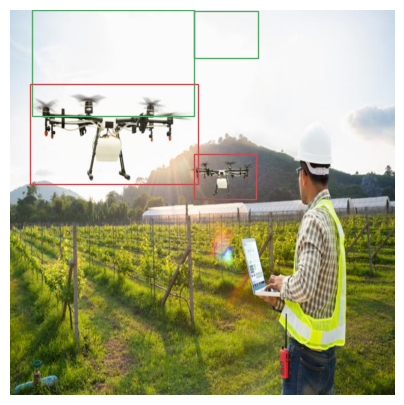


0: 640x640 1 drones, 16.9ms
Speed: 5.9ms preprocess, 16.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


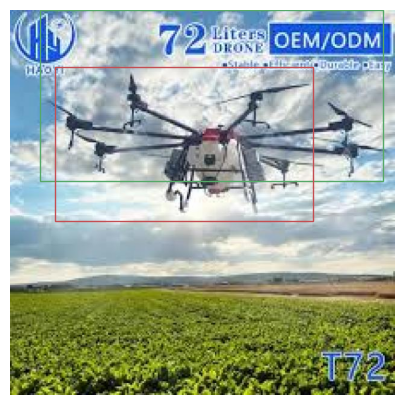


0: 640x640 1 drones, 15.0ms
Speed: 1.9ms preprocess, 15.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


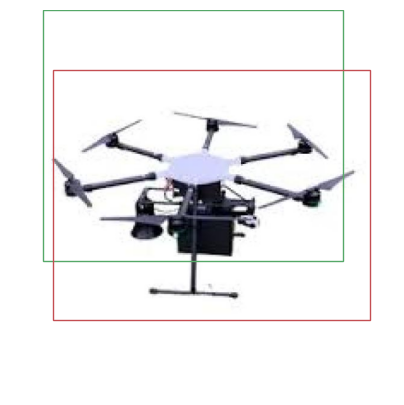


0: 640x640 1 drones, 12.9ms
Speed: 1.7ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


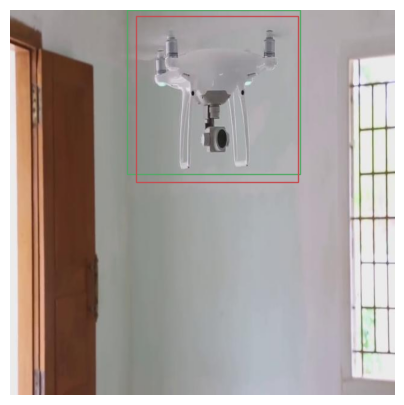


0: 640x640 1 drones, 16.0ms
Speed: 1.9ms preprocess, 16.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


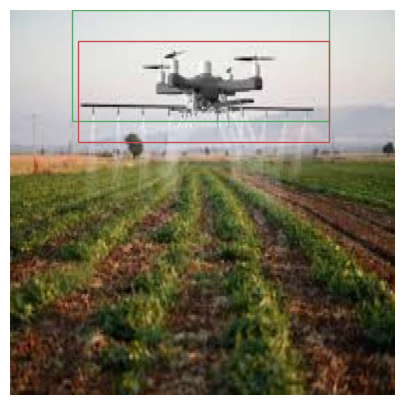


0: 640x640 1 drones, 13.5ms
Speed: 1.9ms preprocess, 13.5ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


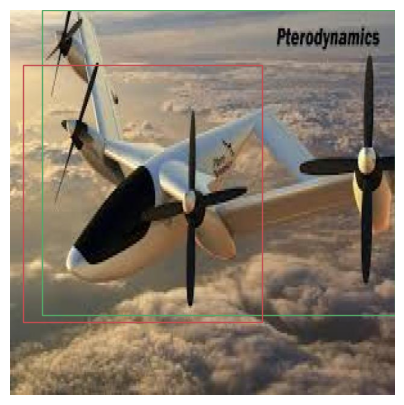


0: 640x640 1 drones, 19.0ms
Speed: 2.7ms preprocess, 19.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


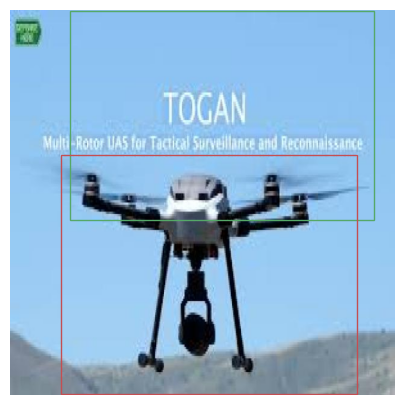


0: 640x640 3 droness, 23.7ms
Speed: 1.9ms preprocess, 23.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


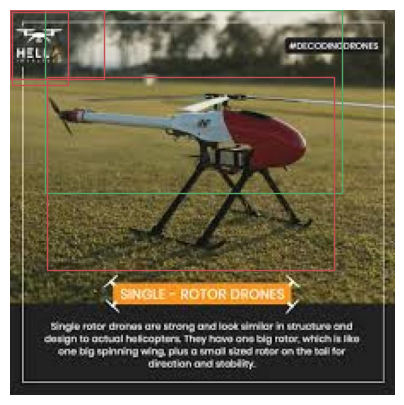


0: 640x640 1 drones, 20.1ms
Speed: 1.9ms preprocess, 20.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


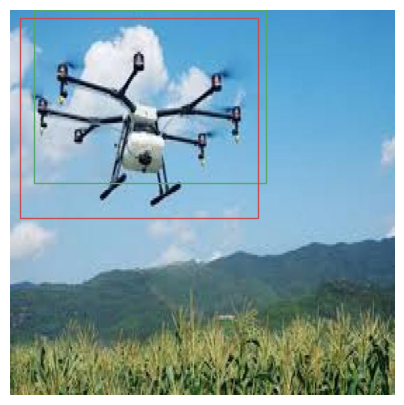


0: 640x640 1 drones, 14.4ms
Speed: 1.9ms preprocess, 14.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


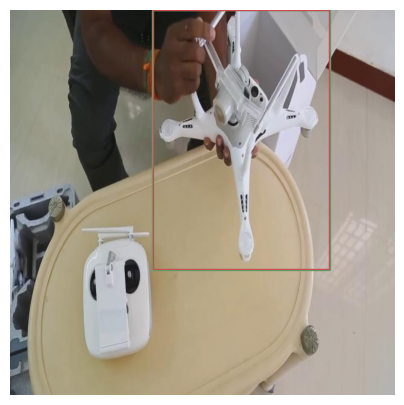


0: 640x640 1 drones, 14.3ms
Speed: 1.9ms preprocess, 14.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


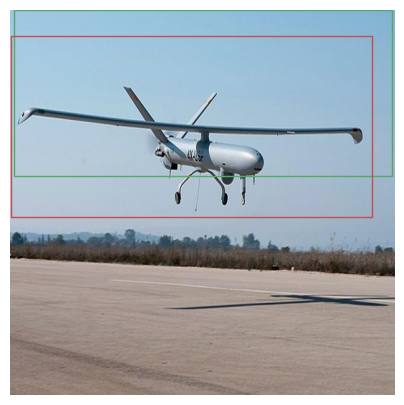


0: 640x640 1 drones, 17.9ms
Speed: 1.9ms preprocess, 17.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


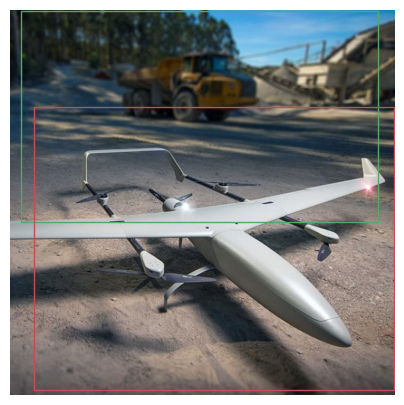


0: 640x640 2 droness, 14.8ms
Speed: 2.0ms preprocess, 14.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


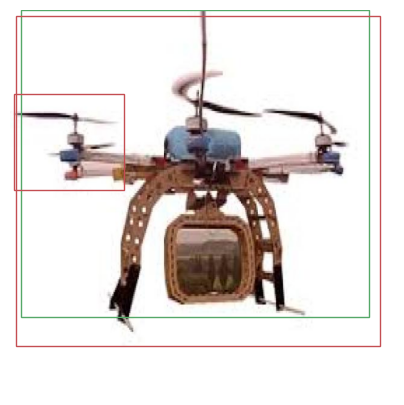


0: 640x640 1 drones, 14.1ms
Speed: 1.9ms preprocess, 14.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


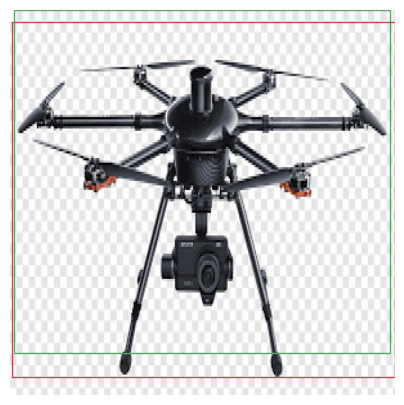


0: 640x640 1 drones, 15.0ms
Speed: 1.9ms preprocess, 15.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


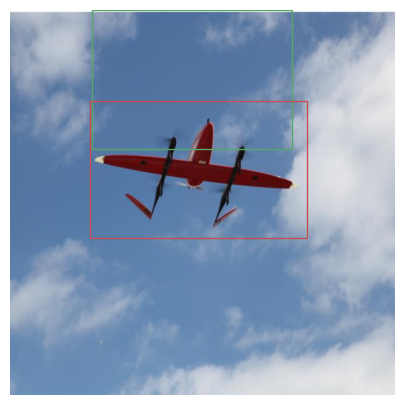


0: 640x640 1 drones, 13.8ms
Speed: 2.0ms preprocess, 13.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


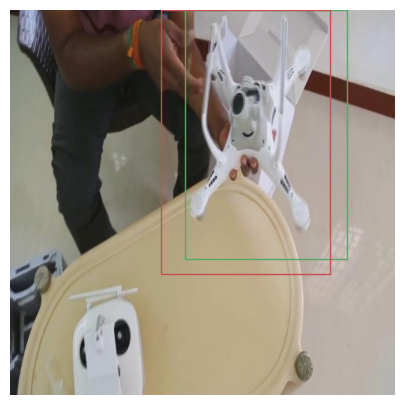


0: 640x640 1 drones, 16.6ms
Speed: 1.9ms preprocess, 16.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


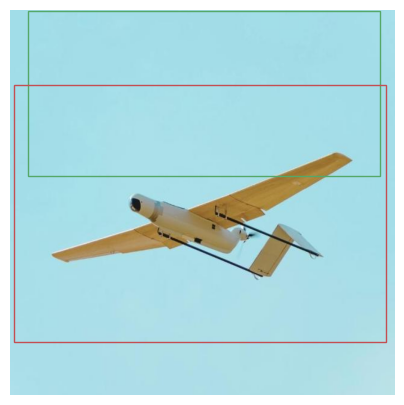


0: 640x640 (no detections), 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


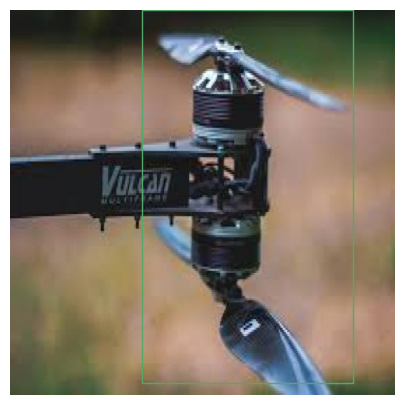


0: 640x640 1 drones, 22.6ms
Speed: 1.9ms preprocess, 22.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


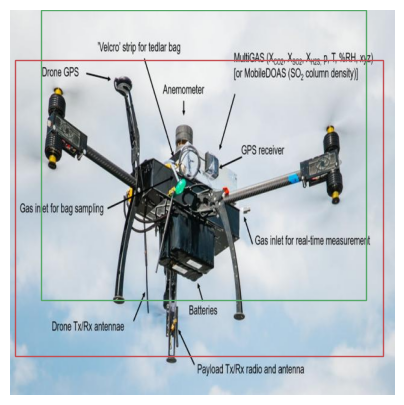


0: 640x640 1 drones, 12.7ms
Speed: 1.9ms preprocess, 12.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


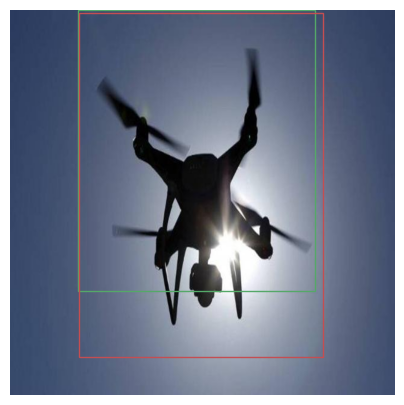


0: 640x640 1 drones, 13.0ms
Speed: 1.9ms preprocess, 13.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


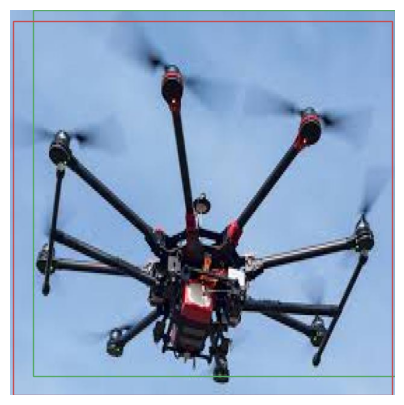


0: 640x640 1 drones, 14.7ms
Speed: 2.0ms preprocess, 14.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


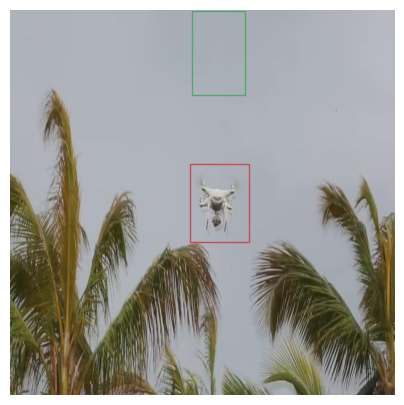


0: 640x640 1 drones, 13.3ms
Speed: 2.0ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


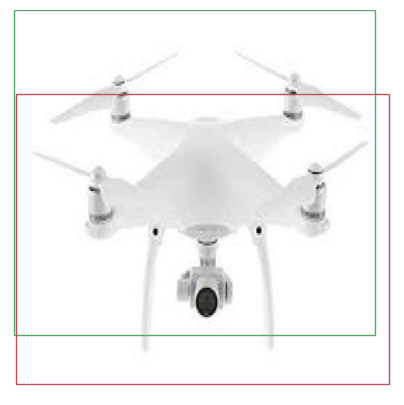


0: 640x640 1 drones, 15.9ms
Speed: 1.8ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


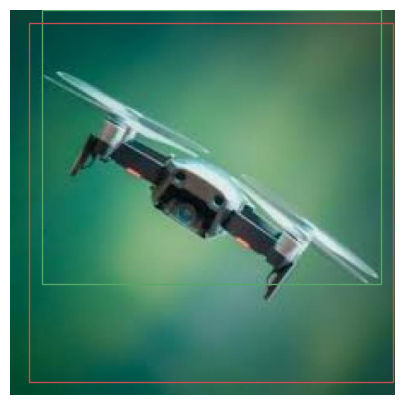


0: 640x640 2 droness, 12.9ms
Speed: 1.9ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


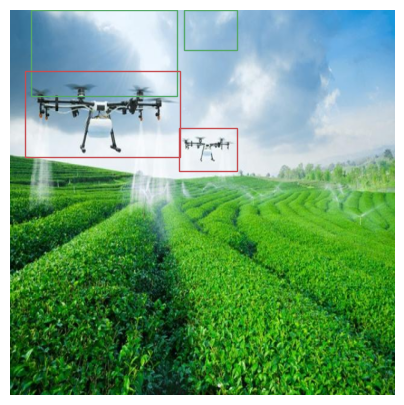


0: 640x640 3 droness, 12.9ms
Speed: 3.2ms preprocess, 12.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


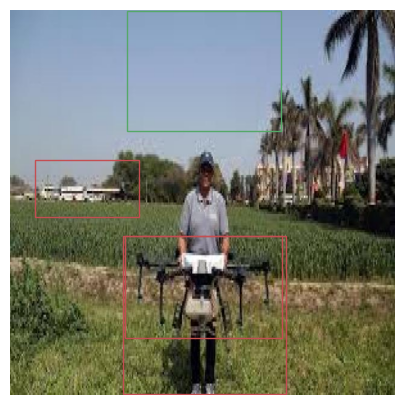


0: 640x640 1 drones, 13.0ms
Speed: 3.8ms preprocess, 13.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


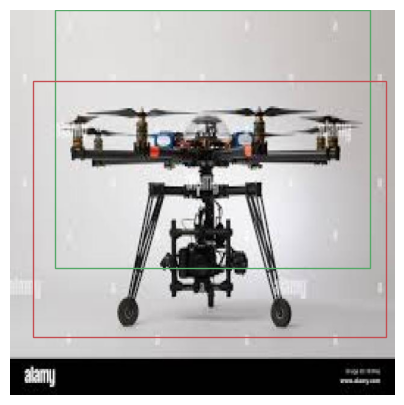


0: 640x640 1 drones, 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


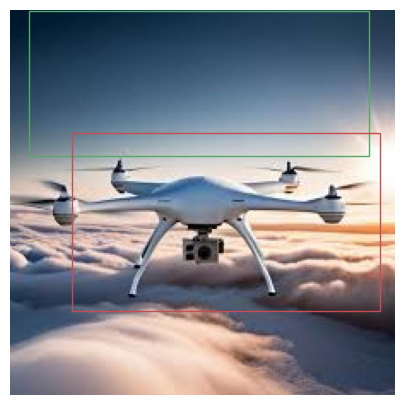


0: 640x640 1 drones, 23.1ms
Speed: 2.3ms preprocess, 23.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


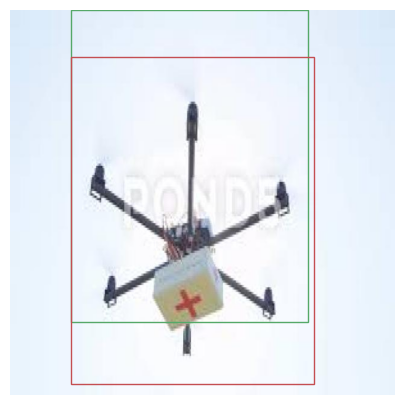


0: 640x640 2 droness, 17.0ms
Speed: 1.9ms preprocess, 17.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


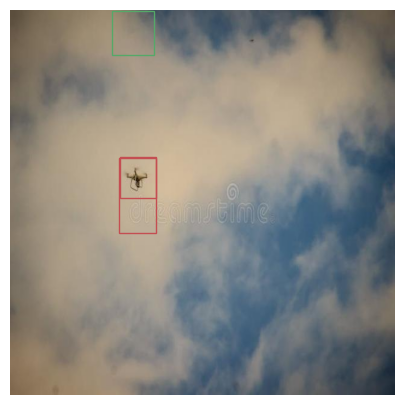


0: 640x640 1 drones, 13.2ms
Speed: 1.9ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


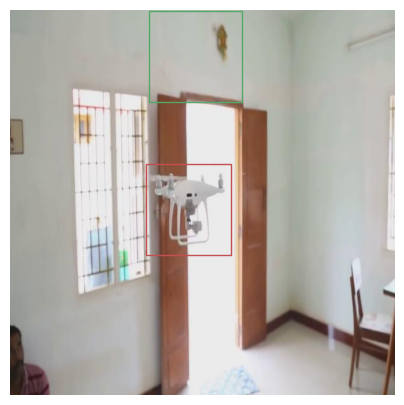


0: 640x640 2 droness, 15.2ms
Speed: 1.9ms preprocess, 15.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


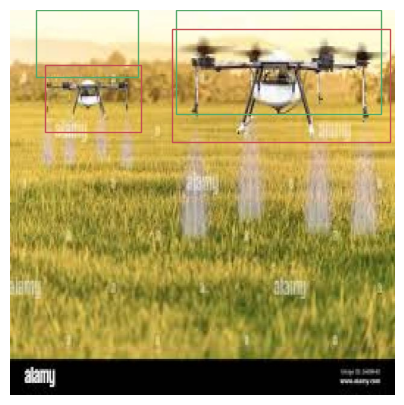


0: 640x640 1 drones, 13.7ms
Speed: 1.8ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


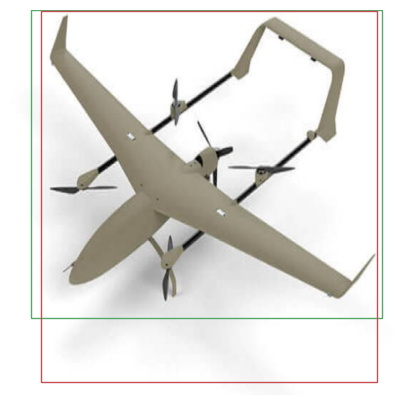


0: 640x640 2 droness, 15.9ms
Speed: 2.1ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


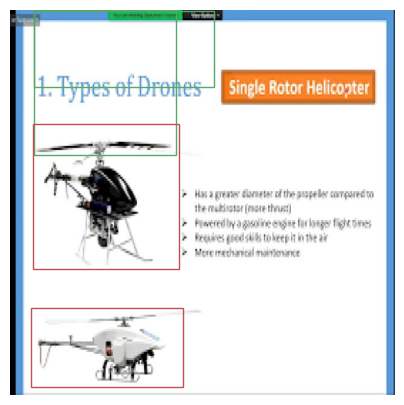


0: 640x640 1 drones, 14.4ms
Speed: 1.9ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


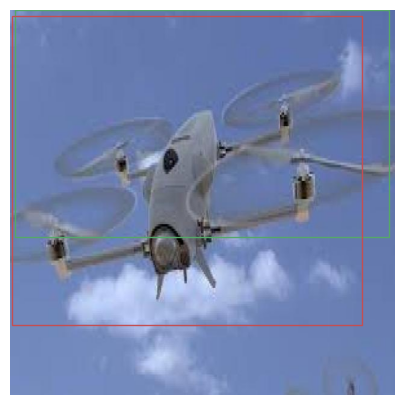


0: 640x640 1 drones, 13.0ms
Speed: 2.1ms preprocess, 13.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


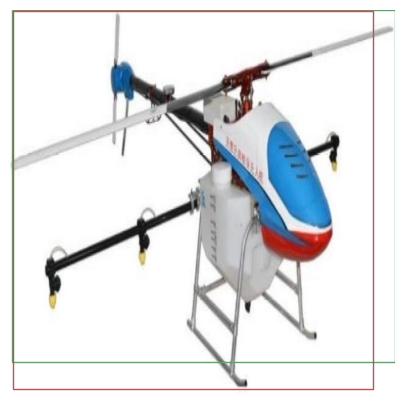


0: 640x640 1 drones, 13.1ms
Speed: 1.9ms preprocess, 13.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


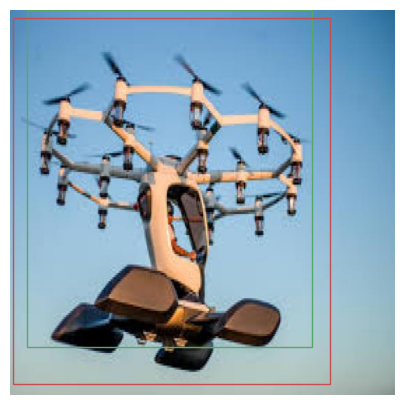


0: 640x640 1 drones, 12.9ms
Speed: 1.9ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


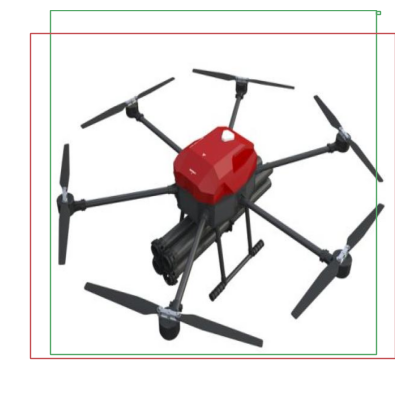


0: 640x640 1 drones, 13.2ms
Speed: 1.9ms preprocess, 13.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


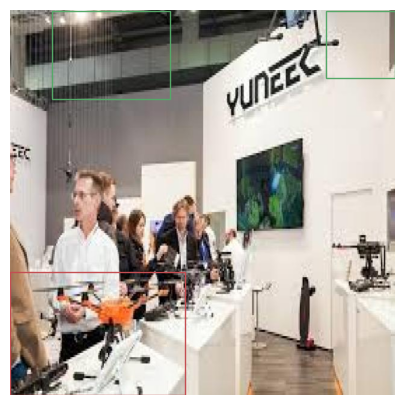


0: 640x640 1 drones, 13.4ms
Speed: 2.0ms preprocess, 13.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


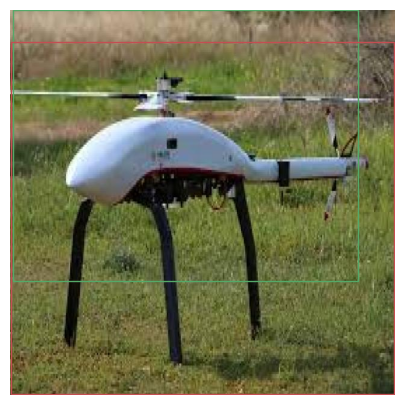


0: 640x640 1 drones, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


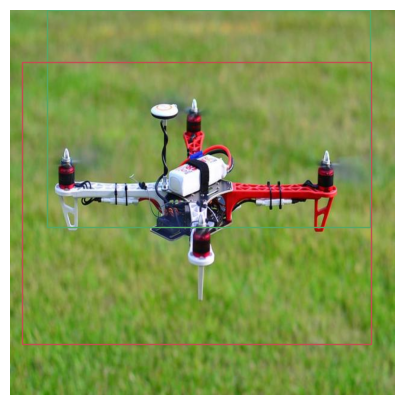


0: 640x640 2 droness, 14.0ms
Speed: 2.1ms preprocess, 14.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


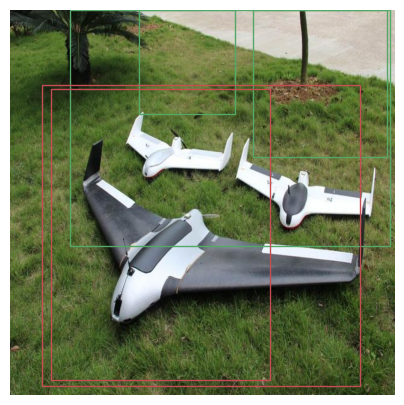


0: 640x640 1 drones, 12.9ms
Speed: 1.8ms preprocess, 12.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


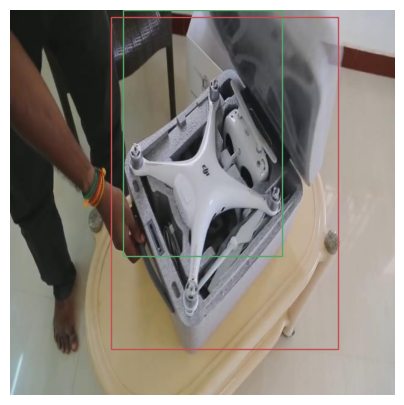


0: 640x640 1 drones, 13.4ms
Speed: 1.9ms preprocess, 13.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


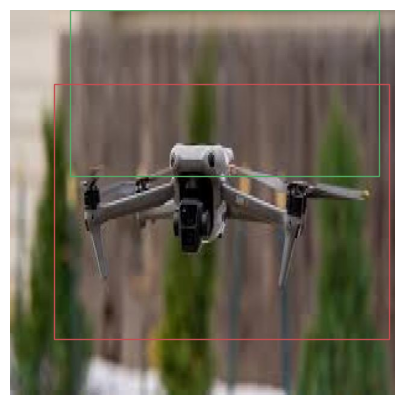


0: 640x640 1 drones, 14.8ms
Speed: 1.9ms preprocess, 14.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


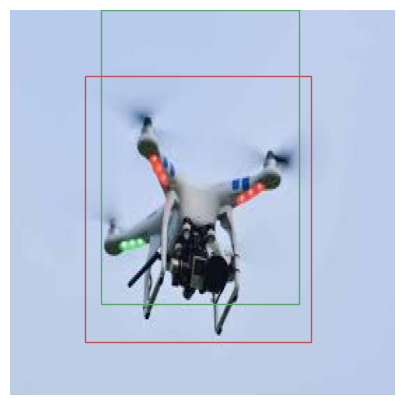


0: 640x640 (no detections), 14.2ms
Speed: 2.0ms preprocess, 14.2ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


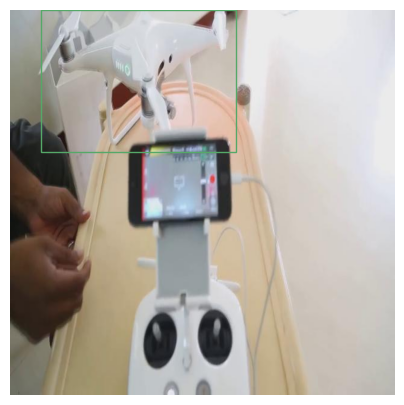


0: 640x640 1 drones, 17.9ms
Speed: 2.0ms preprocess, 17.9ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


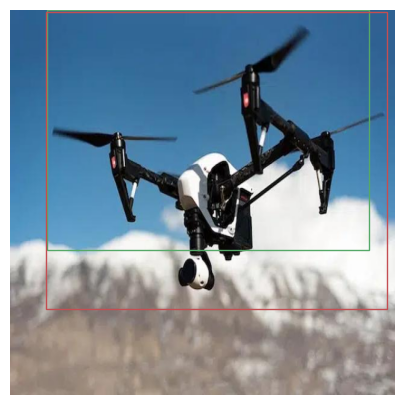


0: 640x640 2 droness, 13.4ms
Speed: 1.9ms preprocess, 13.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


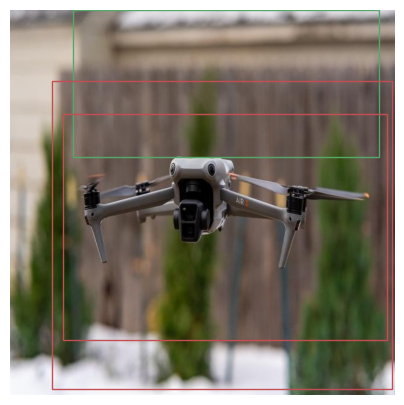


0: 640x640 1 drones, 13.7ms
Speed: 1.9ms preprocess, 13.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


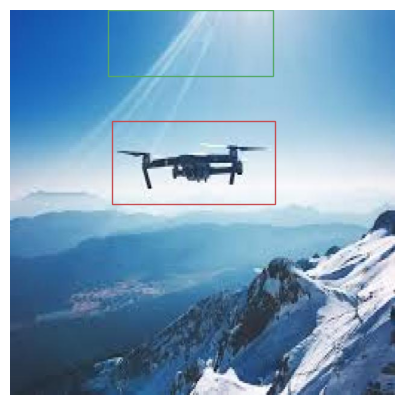


0: 640x640 2 droness, 13.3ms
Speed: 2.0ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


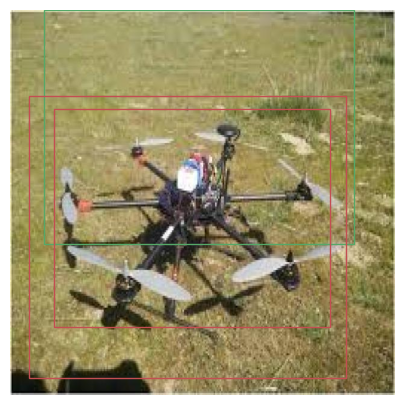

In [17]:
%matplotlib inline

import os
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

images_dir = '/content/uav-yolov8/UAV_YOLOv8/test/images'
annotations_dir = '/content/uav-yolov8/UAV_YOLOv8/test/labels'

image_files = [f for f in os.listdir(images_dir) if f.endswith(('.jpg'))]

test_image_paths = [os.path.join(images_dir, f) for f in image_files]
annotation_paths = [os.path.join(annotations_dir, f.replace('.jpg', '.txt')) for f in image_files]

# test_image_paths=['/content/uav-yolov8/UAV_YOLOv8/test/images/31cVpQkmEHL_jpg.rf.75c3fff900b3a6f371eb624c96a4a463.jpg']
# annotation_paths=['/content/uav-yolov8/UAV_YOLOv8/test/labels/31cVpQkmEHL_jpg.rf.75c3fff900b3a6f371eb624c96a4a463.txt']

for i, image_path in enumerate(test_image_paths):
    img = Image.open(image_path)
    width, height = img.size

    with open(annotation_paths[i], 'r') as f:
        annotations = f.readlines()

    plt.figure(figsize=(5, 5))
    plt.imshow(img)

    for annotation in annotations:
        parts = annotation.strip().split()
        xgt, ygt, wgt, hgt = map(float, parts[1:5])

        gt_xmin = (xgt - wgt / 2) * width
        gt_ymin = (ygt - hgt / 2) * height

        gt_ymin = ygt - hgt / 2
        gt_rect = patches.Rectangle((gt_xmin, gt_ymin), wgt * width, hgt * height, linewidth=1, edgecolor='g', facecolor='none')
        plt.gca().add_patch(gt_rect)

    results = model(img)
    for result in results:
        boxes = result.boxes.xywh.cpu().numpy()
        for box in boxes:
            x, y, w, h = box[:4]

            xmin = (x - w / 2)
            ymin = (y - h / 2)

            rect = patches.Rectangle((xmin, ymin), w , h , linewidth=1, edgecolor='r', facecolor='none')
            plt.gca().add_patch(rect)

    plt.axis('off')
    plt.show()


In [18]:
torch.save(model.state_dict(), 'yolov8trained.pt')
